In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib.pyplot as plt
from wbfm.utils.projects.finished_project_data import ProjectData
import napari
import pandas as pd
from tqdm.auto import tqdm
import numpy as np
from collections import defaultdict
import zarr
from pathlib import Path
import os
import seaborn as sns

/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")


In [2]:
from sklearn.decomposition import PCA
from wbfm.utils.visualization.plot_traces import make_grid_plot_from_dataframe
import seaborn as sns
import plotly.express as px

In [37]:
# fname = "/scratch/neurobiology/zimmer/Charles/dlc_stacks/2022-11-27_spacer_7b_2per_agar/ZIM2165_Gcamp7b_worm1-2022_11_28/project_config.yaml"
# Manually corrected version
fname = "/scratch/neurobiology/zimmer/Charles/dlc_stacks/manually_annotated/paper_data/ZIM2165_Gcamp7b_worm1-2022_11_28/project_config.yaml"
project_data_gcamp = ProjectData.load_final_project_data_from_config(fname)

ConfigFile  : INFO     =======================================
Project data for directory:
/scratch/neurobiology/zimmer/Charles/dlc_stacks/manually_annotated/paper_data/ZIM2165_Gcamp7b_worm1-2022_11_28 
With raw data in directory:
/scratch/neurobiology/zimmer/ulises/wbfm/20221127/data/ZIM2165_Gcamp7b_worm1/2022-11-27_15-14_ZIM2165_worm1_GC7b_Ch0-BH 

Found the following data files:
============Raw========================
red_data:                 True
green_data:               True
============Annotations================
manual_tracking:          True
============Segmentation===============
raw_segmentation:         True
colored_segmentation:     False
============Traces=====================
traces:                   True



In [19]:
fname = "/scratch/neurobiology/zimmer/Charles/dlc_stacks/immobilization_tests/2022-12-12_immob/2022-12-13_10-38_ZIM2165_immob_worm8-2022-12-13/project_config.yaml"
project_data_immob = ProjectData.load_final_project_data_from_config(fname)

ConfigFile  : INFO     =======================================
Project data for directory:
/scratch/neurobiology/zimmer/Charles/dlc_stacks/immobilization_tests/2022-12-12_immob/2022-12-13_10-38_ZIM2165_immob_worm8-2022-12-13 
With raw data in directory:
None 

Found the following data files:
============Raw========================
red_data:                 True
green_data:               True
============Annotations================
manual_tracking:          False
============Segmentation===============
raw_segmentation:         True
colored_segmentation:     True
============Traces=====================
traces:                   True



# Make the all-in-one summary figure, and the rotate the 3d plot to be a good angle

In [5]:
from wbfm.utils.visualization.plot_traces import make_summary_interactive_heatmap_with_pca

/home/charles/anaconda3/envs/wbfm38/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1583: RuntimeWarning:

All-NaN slice encountered

/home/charles/Current_work/repos/dlc_for_wbfm/wbfm/utils/external/utils_self_collision.py:35: RuntimeWarning:

Mean of empty slice



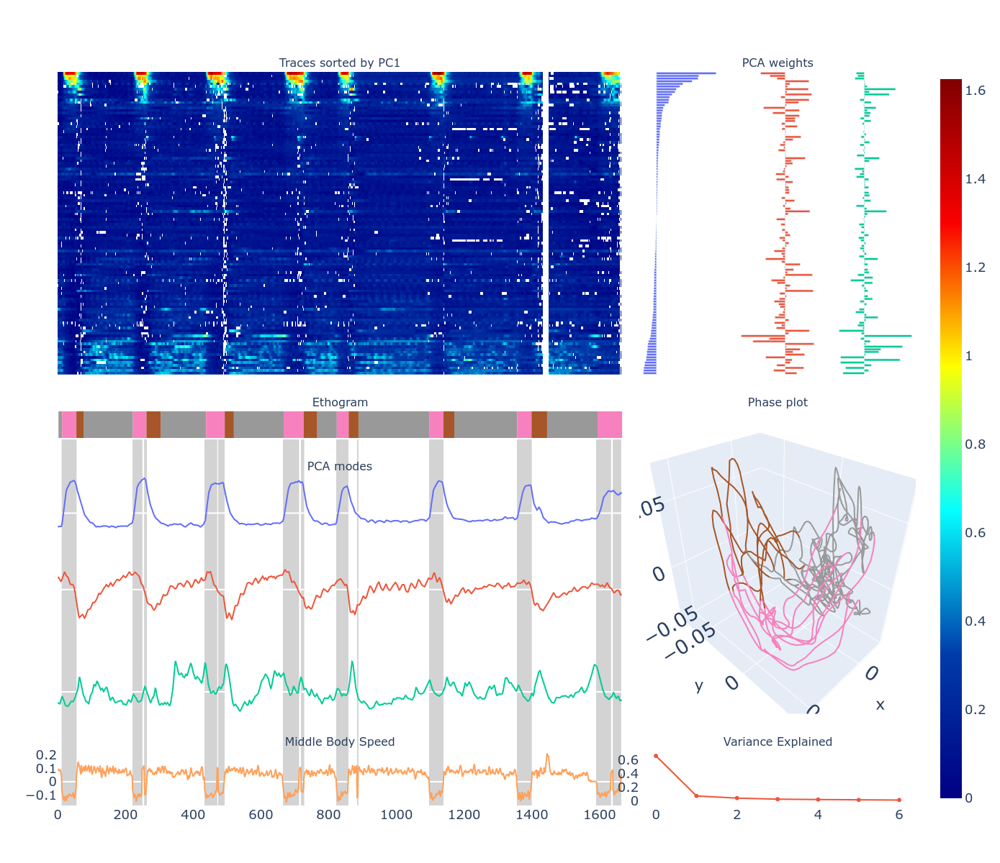

In [38]:
fig = make_summary_interactive_heatmap_with_pca(project_data_gcamp, to_save=False, to_show=True)

In [39]:
# %debug

## Immobilized

In [18]:
from wbfm.utils.general.utils_behavior_annotation import approximate_behavioral_annotation_using_pc1
beh_vec = approximate_behavioral_annotation_using_pc1(project_data_immob)

ConfigFile  : INFO     Saving at: behavior/immobilized_beh_annotation.xlsx


ConfigFile  : INFO     Updating config file /scratch/neurobiology/zimmer/Charles/dlc_stacks/immobilization_tests/2022-12-12_immob/2022-12-13_10-38_ZIM2165_immob_worm8-2022-12-13/behavior/behavior_config.yaml on disk


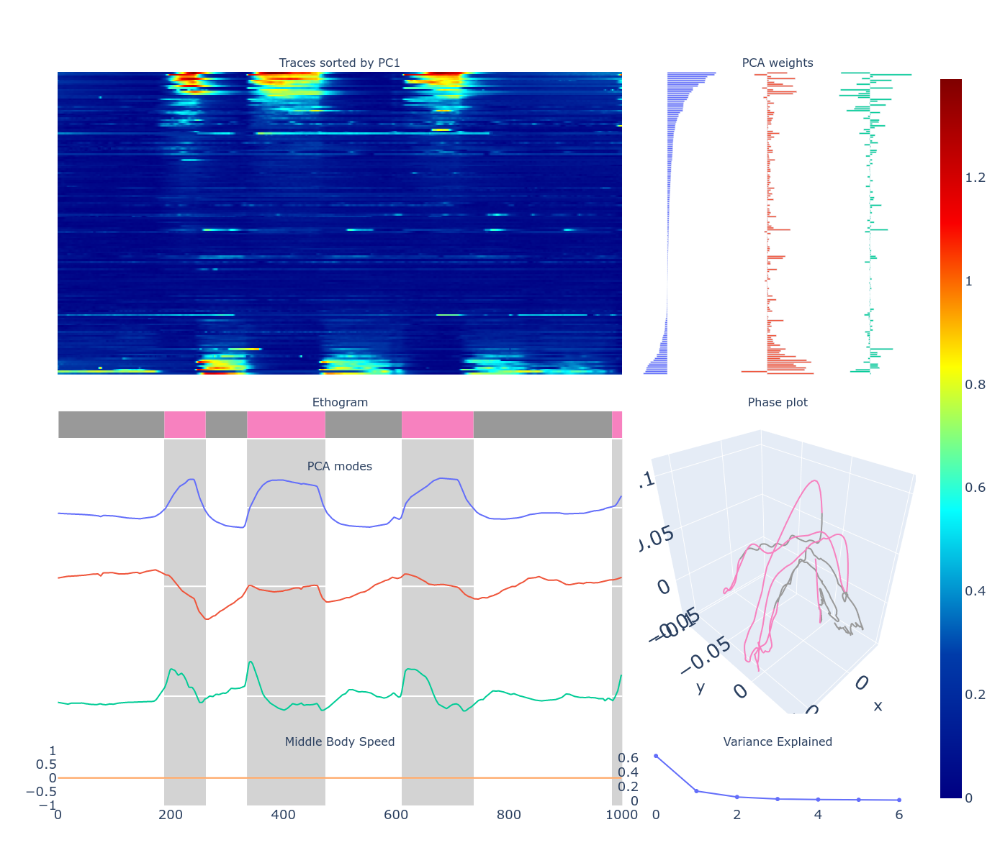

In [28]:
fig = make_summary_interactive_heatmap_with_pca(project_data_immob, to_save=False, to_show=True, trace_opt=dict(nan_using_ppca_manifold=False))

In [40]:
# %debug